In [1]:
from skimage import io, exposure
import os
import matplotlib.pyplot as plt

from PIL import Image
from PIL.TiffTags import TAGS

import numpy as np

from scipy.ndimage import gaussian_filter, sobel

from skimage import morphology


### Defining functions

In [2]:
def local_variance_filter(image,radius=20):
   # time1 = time.time()
    kernel = morphology.disk(radius)
    variance = np.zeros(image.shape)
    for i in np.arange(radius,image.shape[0]-radius):
        for j in np.arange(radius,image.shape[1]-radius):
            pixels = image[i-radius:i+radius+1,j-radius:j+radius+1] * kernel
            variance[i,j] = np.var(pixels[kernel==1])
   # print(str(time.time()-time1)+" s ")
    return variance

In [3]:
# Getting metadata for small image (resolution)
def get_metadata(im_small):
    exifdata = im_small.getexif()
    for tag_id in exifdata:
        # get the tag name, instead of human unreadable tag id
        tag = TAGS.get(tag_id, tag_id)
        data = exifdata.get(tag_id)
        # decode bytes
        if isinstance(data, bytes):
            data = data.decode()

        if tag == 'ImageWidth':
            im_w = data
            print(f"{tag}: {data}")
        elif tag == 'ImageLength':
            im_h = data
            print(f"{tag}: {data}")
        elif tag == 'XResolution':
            x_res = data
            print(f"{tag}: {data}")
        elif tag == 'YResolution':
            y_res = data
            print(f"{tag}: {data}")

    
    return im_w, im_h, x_res, y_res

In [4]:
def distance_two_images(im1, im2):
    """ the euclidean square distance of two images in terms of intensity is calculated
    :im1 np.array of the big image
    :im2 np.array of the small image   """
    
    (height, width) = np.shape(im1)
    (h, w) = np.shape(im2)
    d = np.empty((height - h, width - w))
    
    for row in range(height - h):
        for col in range(width - w):
            d[row,col] = np.sum( np.square( np.subtract(im1[0+row : h+row, 0+col : w+col] , im2) ))
    
    return d

In [5]:
def position_of_min(d):
    """ determine the position of minimum
    :d np.array of distances """
    
    result = np.where(d == np.amin(d))
    print("the minimum distance is: ", np.amin(d))
    print('Tuple of arrays returned : ', result)
    
    return result

### Defining parameters

In [6]:
# Setting parameters
data_folder = '/monocytes/'

im_small_filename = 'topo_20220107_Exp3_Cell13_map-data-2022.01.07-18.24.20.932_processed-2022.01.10-13.12.44.tif'
im_large_filename = '20220117_E3_Cell13BF.tif'

px_large = 9.4e-8  #(Hamamatsu camera - for ICM images) - this will determine rescaling (it will be rounded to integer based on the resolution of the small image that is encoded in the tif metadata)

var_filt_radius = 3 # radius for variance filtering
perc_threshold = 80 # percentile threshold for binarsising filtered result

thr_overlay_vis = 12 # threshold for visualising overlay (applied to small image)


### Loading data

In [7]:
img_path = os.getcwd() + data_folder

# loading
im_small = Image.open(img_path + im_small_filename)
im_large = Image.open(img_path + im_large_filename)

# loading with sklearn image
io.use_plugin('pil')
img_large_sk = io.imread(img_path + im_large_filename)

# loading metadata (small)
im_w, im_h, x_res, y_res = get_metadata(im_small)

im_small_np = np.rot90(np.asarray(im_small), k=3)
im_large_np = np.asarray(im_large)

# dealing with resolution
px_large = 9.4e-8  #(Hamamatsu camera - for ICM images)
px_small = 1/float(x_res) * 10**(-2)
resc_rat = round(px_small/px_large)

print(px_small)
print(px_large)
print('\n \n \n Rounded ratio between resolutions: ', round(resc_rat, 4))

ImageWidth: 64
ImageLength: 64
XResolution: 21333.396059127983
YResolution: 21333.396059127983
4.687486217517286e-07
9.4e-08

 
 
 Rounded ratio between resolutions:  5


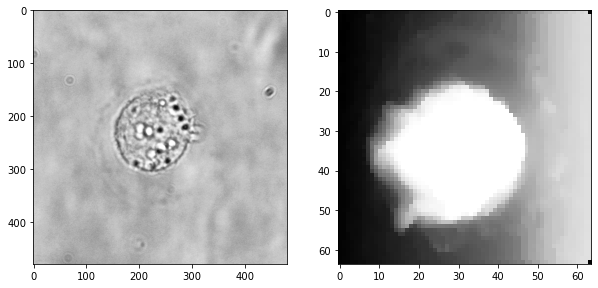

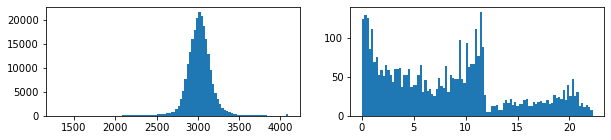

In [8]:
# plotting original images and their histograms
_,axs = plt.subplots(1,2, figsize=(10,20))
axs[0].imshow(im_large_np, cmap='Greys_r')
axs[1].imshow(im_small_np, cmap='Greys_r', vmax=15)

_,axs = plt.subplots(1,2, figsize=(10,2))
axs[0].hist(im_large_np.flatten(), 100)
axs[1].hist(im_small_np.flatten(), 100);

### Preprocessing small image

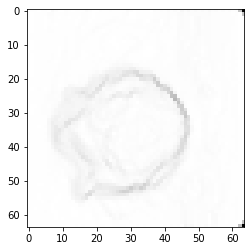

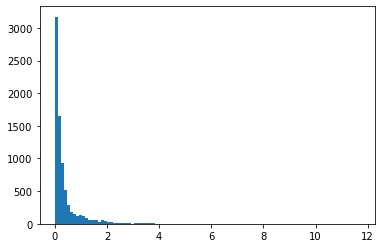

In [9]:
diff_small = np.gradient(im_small_np)
template = np.sqrt(diff_small[0][:,:]**2 + diff_small[1][:,:]**2)

plt.figure()
plt.imshow(template, cmap='Greys')

plt.figure()
plt.hist(np.abs(diff_small).flatten()[np.abs(diff_small).flatten()!=0],100);

### Preprocessing large image

In [10]:
# Contrast stretching 

p2, p98 = np.percentile(img_large_sk, (2, 98))
im_rescale = exposure.rescale_intensity(img_large_sk, in_range=(p2, p98))

# Equalization
im_eq = exposure.equalize_hist(img_large_sk)

# Adaptive Equalization
im_adapteq = exposure.equalize_adapthist(img_large_sk, clip_limit=0.03)

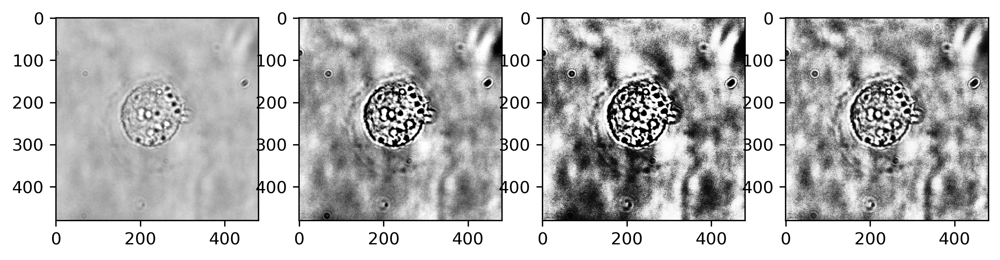

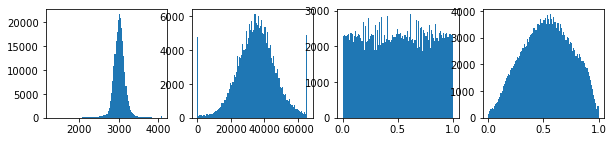

In [11]:
_,axs = plt.subplots(1,4, figsize=(10,40), dpi=300)
axs[0].imshow(im_large_np, cmap='Greys_r')
axs[1].imshow(im_rescale, cmap='Greys_r')
axs[2].imshow(im_eq, cmap='Greys_r')
axs[3].imshow(im_adapteq, cmap='Greys_r')

_,axs = plt.subplots(1,4, figsize=(10,2))
axs[0].hist(im_large_np.flatten(), 100)
axs[1].hist(im_rescale.flatten(), 100)
axs[2].hist(im_eq.flatten(), 100)
axs[3].hist(im_adapteq.flatten(), 100);

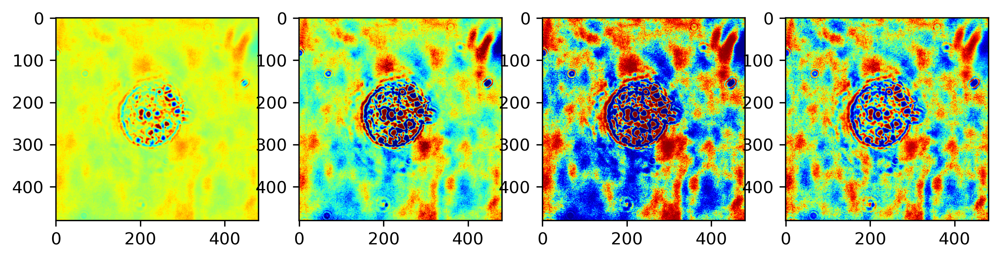

In [12]:
_,axs = plt.subplots(1,4, figsize=(10,40), dpi=300)
axs[0].imshow(im_large_np, cmap='jet')
axs[1].imshow(im_rescale, cmap='jet')
axs[2].imshow(im_eq, cmap='jet')
axs[3].imshow(im_adapteq, cmap='jet')

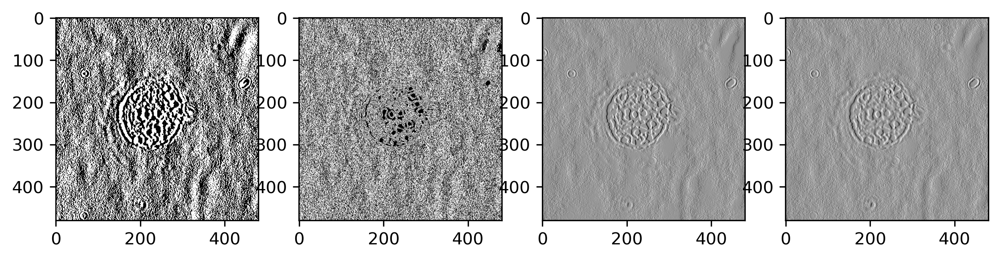

In [13]:
_,axs = plt.subplots(1,4, figsize=(10,40), dpi=300)
axs[0].imshow(sobel(im_large_np), cmap='Greys_r')
axs[1].imshow(sobel(im_rescale), cmap='Greys_r')
axs[2].imshow(sobel(im_eq), cmap='Greys_r')
axs[3].imshow(sobel(im_adapteq), cmap='Greys_r')

In [14]:
var = local_variance_filter(im_large_np, radius=var_filt_radius)

In [15]:
perc = np.percentile(var, perc_threshold)
print(perc)

3737.4092746730084


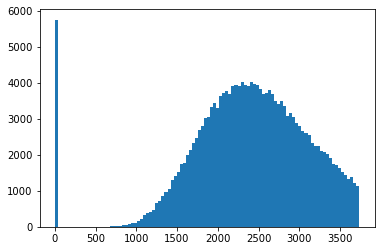

In [16]:
plt.hist(var.flatten()[var.flatten()<perc], 100);

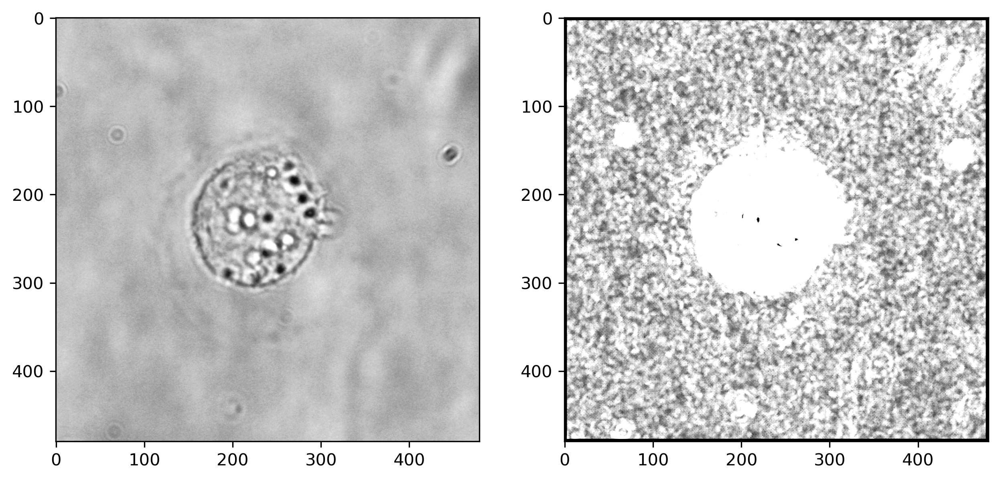

In [17]:
_,axs = plt.subplots(1,2, figsize=(10,20), dpi=300)
axs[0].imshow(im_large_np, cmap='Greys_r')
axs[1].imshow(var, cmap='Greys_r', vmin=0, vmax=perc)

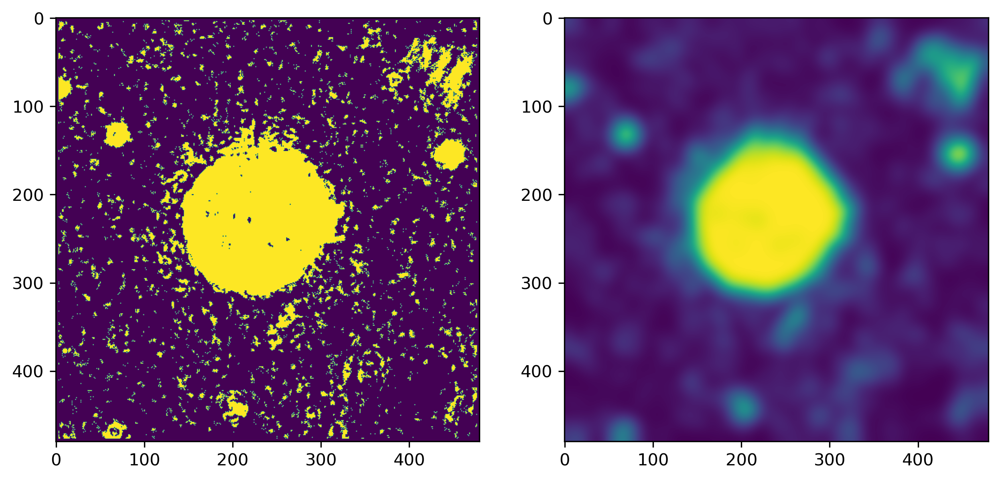

In [18]:
var_thr = var.copy()
var_thr[var_thr < perc] = 0
var_thr[var_thr >= perc] = 1

_,axs = plt.subplots(1,2, figsize=(10,20), dpi=300)

axs[0].imshow(var_thr)
axs[1].imshow(gaussian_filter(var_thr, 10))

In [19]:
im_final = var_thr

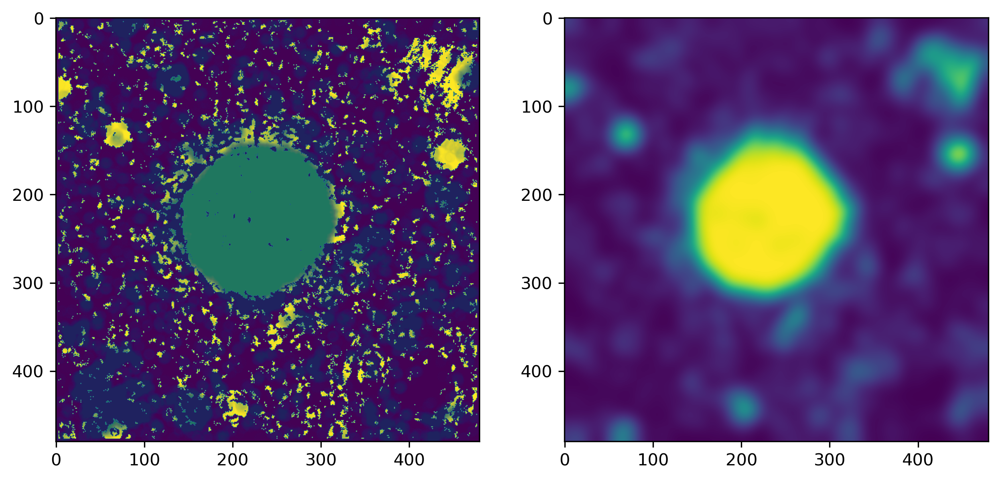

In [20]:
_,axs = plt.subplots(1,2, figsize=(10,20), dpi=300)

axs[0].imshow(var_thr)
axs[1].imshow(gaussian_filter(var_thr, 10))
nonzero_final = np.where(im_final > 0)
axs[0].scatter(nonzero_final[0],nonzero_final[1], alpha=0.01)


### Resizing images to match pixels

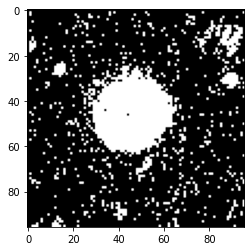

In [21]:
im_final_downs = im_final[::resc_rat,::resc_rat]
im_orig_downs = im_large_np[::resc_rat,::resc_rat]
plt.imshow(im_final_downs, cmap='Greys_r')

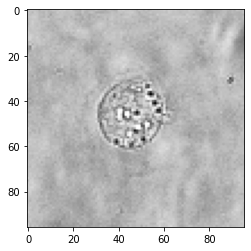

In [22]:
plt.imshow(im_orig_downs, cmap='Greys_r')

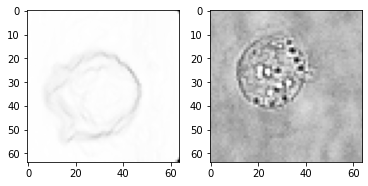

In [23]:
_,axs = plt.subplots(1,2)
axs[0].imshow(template, cmap='Greys')
axs[1].imshow(im_large_np[100:(100+64*resc_rat):resc_rat, 100:(100+64*resc_rat):resc_rat], cmap='Greys_r')

### Trying cross-correlation

In [24]:
distance = distance_two_images(im_final_downs, im_small_np)
res = position_of_min(distance)

the minimum distance is:  387582.9941653847
Tuple of arrays returned :  (array([9], dtype=int64), array([16], dtype=int64))


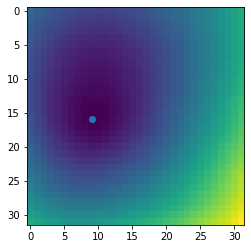

In [25]:
plt.imshow(distance.T)
plt.scatter(res[0][0], res[1][0])

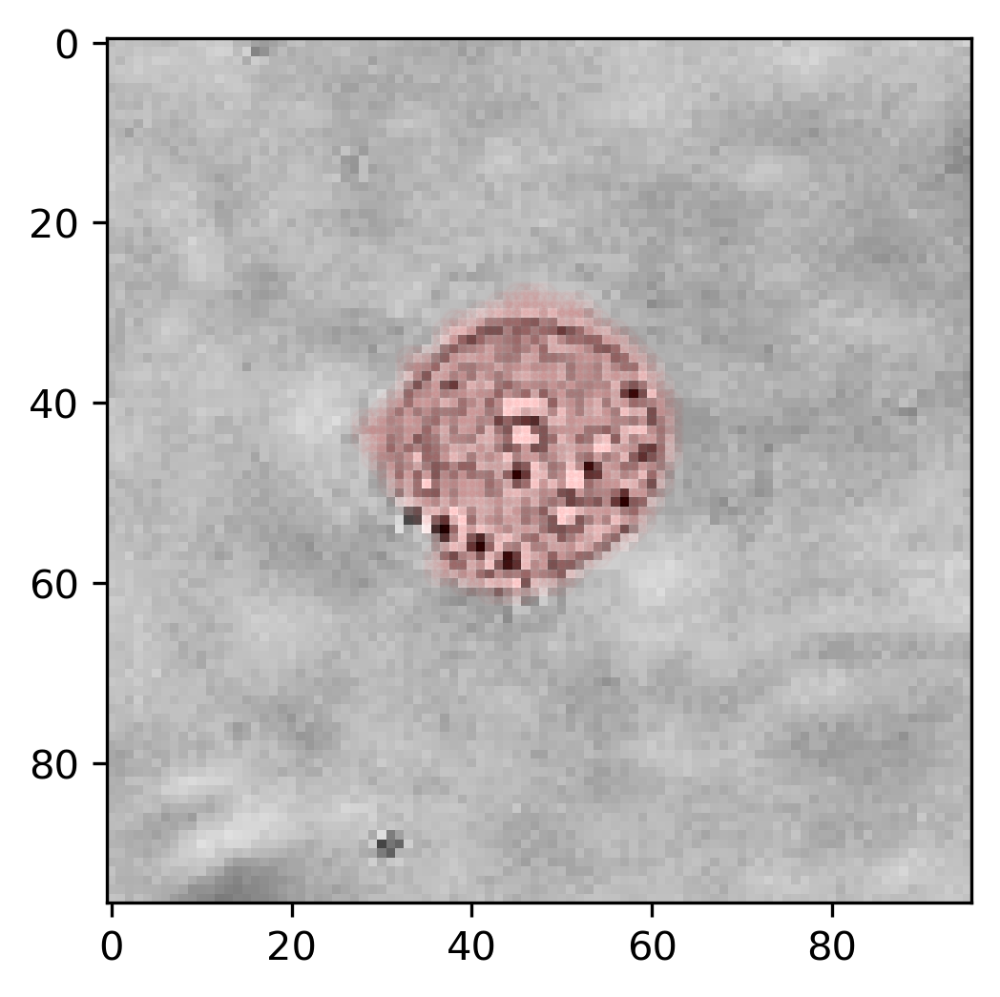

In [26]:
nonzero = np.where(im_small_np > thr_overlay_vis) # only for visualisation

plt.figure(dpi=300)
plt.imshow(im_orig_downs.T, cmap='Greys_r')
plt.scatter(res[1][0]+nonzero[1], res[0][0]+nonzero[0], alpha=0.02, c='red')